## Setup

In [4]:
import random
import numpy as np
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers
from tensorflow.keras.applications import resnet
from tensorflow.keras import Model
import matplotlib.pyplot as plt
from keras.utils import Sequence
import glob
import os
import pandas as pd
import cv2

## Hyperparameters

In [24]:
epochs = 30
batch_size = 4
margin = 1  # Margin for contrastive loss.
img_size = 417
train_val_split = 0.9

# Paths
path17 = "H:/Datasets/Siamois_62_5/tri_main_siamois/2017/"
path21 = "H:/Datasets/Siamois_62_5/tri_main_siamois/2021/"
path_txt = "H:/Datasets/Siamois_62_5/tri_main_siamois/labels_tri_main.txt"
class_names = ["same","changed"]

## Load the dataset

In [25]:
def load_pair(left,right):
    im_left = cv2.imread(path17+left)
    im_left = cv2.cvtColor(im_left,cv2.COLOR_BGR2RGB)
    im_right = cv2.imread(path21+right)
    im_right = cv2.cvtColor(im_right,cv2.COLOR_BGR2RGB)
    return im_left,im_right

def load_pair_2(left,right):
    im_left = cv2.imread(left)
    im_left = cv2.cvtColor(im_left,cv2.COLOR_BGR2RGB)
    im_right = cv2.imread(right)
    im_right = cv2.cvtColor(im_right,cv2.COLOR_BGR2RGB)
    return im_left,im_right

In [26]:
class DataGenerator(Sequence):
    def __init__(self, data_file, batch_size):
        self.data_file = data_file
        self.batch_size = batch_size
        self.num_samples = self.get_num_samples()
        self.num_batches = int(np.ceil(self.num_samples / self.batch_size))

    def get_num_samples(self):
        # Implement your logic to determine the total number of samples
        # in your dataset file and return that value.
        # For example, if your data file is a CSV file, you can use pandas
        # to read the file and count the number of rows.
        return len(self.data_file)

    def __len__(self):
        return self.num_batches

    def __getitem__(self, index):
        start_index = index * self.batch_size
        end_index = min(start_index + self.batch_size, self.num_samples)

        batch_x1, batch_x2, batch_y = self.load_data_chunk(start_index, end_index)

        # Preprocess your data if needed

        return np.array([batch_x1, batch_x2]), batch_y

    def load_data_chunk(self, start_index, end_index):
        batch_x1 = []
        batch_x2 = []
        batch_y = []
        for i in range(start_index, end_index):
            name17,name21,label = self.data_file[i]
            x1,x2= load_pair_2(name17,name21)
            batch_x1.append(x1)
            batch_x2.append(x2)
            batch_y.append(float(label))

        return np.array(batch_x1), np.array(batch_x2), np.array(batch_y)



## Define training and validation sets

In [27]:
# df = pd.read_csv(path_txt,sep=";",header=None,names=["name17","name21","area_changed"])
# df["labels"] = df["area_changed"].apply(lambda x : 1 if x > 1300 else 0 if x < 200 else -1)
# df.drop(df[df['labels'] == -1].index, inplace=True)
# df.drop(inplace=True,columns="area_changed")
# df = df.sample(frac=1) # shuffle
# df["labels"].value_counts()
df = pd.read_csv(path_txt,sep=",")
df.drop(inplace=True,columns="Unnamed: 0")
df = df.sample(frac=1) # shuffle
df["labels"] = df["labels"].apply(lambda x: 1 if x == "changed" else 0)
df["labels"].value_counts()

labels
1    1550
0    1160
Name: count, dtype: int64

In [28]:
data_file = df.to_numpy()
n = len(data_file)
print(n)

2710


In [29]:
split = int(train_val_split * n)
train_data = DataGenerator(data_file[:split], batch_size)
val_data = DataGenerator(data_file[split:], batch_size)

In [30]:
train_data[1][0].shape

(2, 4, 417, 417, 3)

In [31]:
train_data[0][0][0][0].shape

(417, 417, 3)

## Visualize pairs and their labels

In [32]:
def Visualize(batch_x1,batch_x2,labels):
    fig, axes = plt.subplots(nrows=2, ncols=4, figsize=(16, 8))
    for i in range(batch_size//2):
        
        axes[0,i%4].imshow(batch_x1[i])
        axes[0,i%4].axis("off")

        axes[1,i%4].imshow(batch_x2[i])
        axes[1,i%4].axis("off")
        axes[1,i%4].set_title(class_names[int(labels[i])])

def Visualize_pred(batch_x1,batch_x2,labels):
    fig, axes = plt.subplots(nrows=2, ncols=4, figsize=(16, 8))
    for i in range(batch_size//2):
        
        axes[0,i%4].imshow(batch_x1[i])
        axes[0,i%4].axis("off")

        axes[1,i%4].imshow(batch_x2[i])
        axes[1,i%4].axis("off")
        axes[1,i%4].set_title(labels[i])

def Visualize_powerpoint(batch_x1,batch_x2):
    fig, axes = plt.subplots(nrows=2, ncols=4, figsize=(16, 8))
    for i in range(batch_size//2):
        
        axes[0,i%4].imshow(batch_x1[i])
        axes[0,i%4].axis("off")
        axes[0,i%4].set_title("2017")

        axes[1,i%4].imshow(batch_x2[i])
        axes[1,i%4].axis("off")
        axes[1,i%4].set_title("2021")

Inspect training pairs

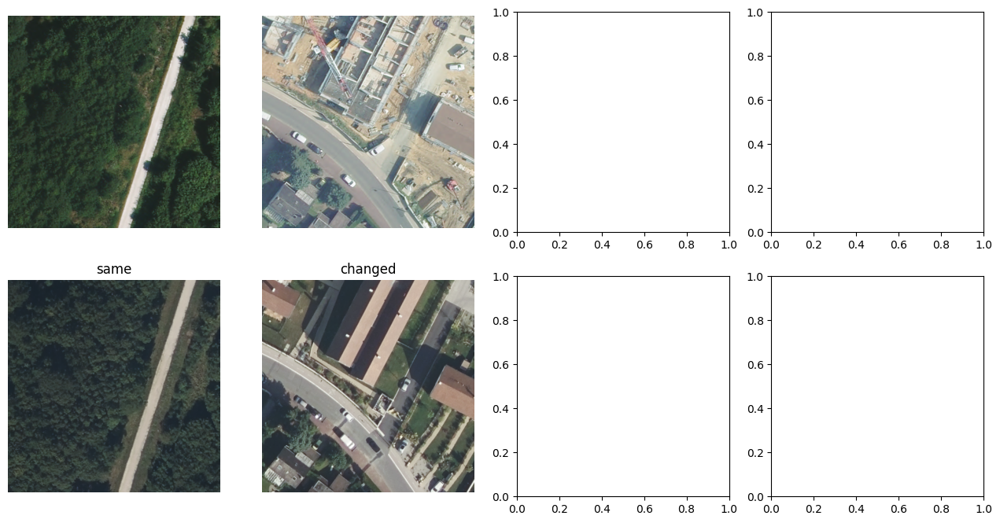

In [33]:
Visualize(train_data[16][0][0],train_data[16][0][1],train_data[16][1])

Inspect validation pairs

Inspect test pairs

## Define the model

There are two input layers, each leading to its own network, which
produces embeddings. A `Lambda` layer then merges them using an
[Euclidean distance](https://en.wikipedia.org/wiki/Euclidean_distance) and the
merged output is fed to the final network.

In [34]:
# Provided two tensors t1 and t2
# Euclidean distance = sqrt(sum(square(t1-t2)))
def euclidean_distance(vects):
    """Find the Euclidean distance between two vectors.

    Arguments:
        vects: List containing two tensors of same length.

    Returns:
        Tensor containing euclidean distance
        (as floating point value) between vectors.
    """

    x, y = vects
    sum_square = tf.math.reduce_sum(tf.math.square(x - y), axis=1, keepdims=True)
    return tf.math.sqrt(tf.math.maximum(sum_square, tf.keras.backend.epsilon()))

In [35]:
# Old model
# input = layers.Input((img_size, img_size, 3))
# # ajouter un rescaling layer
# x = tf.keras.layers.BatchNormalization()(input)
# x = layers.Conv2D(16, (5, 5), activation="tanh")(x)
# x = layers.AveragePooling2D(pool_size=(2, 2))(x)
# x = layers.Conv2D(32, (5, 5), activation="tanh")(x)
# x = layers.AveragePooling2D(pool_size=(2, 2))(x)
# x = layers.Conv2D(64, (3, 3), activation="tanh")(x)
# x = layers.AveragePooling2D(pool_size=(2, 2))(x)
# x = layers.Flatten()(x)

# x = tf.keras.layers.BatchNormalization()(x)
# x = layers.Dense(10, activation="tanh")(x)
# embedding_network = keras.Model(input, x)

# input_12 = layers.Input(shape=((2, img_size, img_size, 3)))
# input_1,input_2 = tf.split(input_12,num_or_size_splits=2,axis=0)
# input_1 = tf.reshape(input_1,(-1, img_size, img_size, 3))
# input_2 = tf.reshape(input_2,(-1, img_size, img_size, 3))
# # input_1 = layers.Input((img_size, img_size, 3))
# # input_2 = layers.Input((img_size, img_size, 3))

# # As mentioned above, Siamese Network share weights between
# # tower networks (sister networks). To allow this, we will use
# # same embedding network for both tower networks.
# tower_1 = embedding_network(input_1)
# tower_2 = embedding_network(input_2)

# merge_layer = layers.Lambda(euclidean_distance)([tower_1, tower_2])
# normal_layer = tf.keras.layers.BatchNormalization()(merge_layer)
# output_layer = layers.Dense(1, activation="sigmoid")(normal_layer)
# siamese = keras.Model(inputs=[input_12], outputs=output_layer)


In [36]:
target_shape = (img_size, img_size, 3)
base_cnn = resnet.ResNet50(weights="imagenet", input_shape=target_shape, include_top=False)

flatten = layers.Flatten()(base_cnn.output)
dense1 = layers.Dense(512, activation="relu")(flatten)
dense1 = layers.BatchNormalization()(dense1)
dense2 = layers.Dense(256, activation="relu")(dense1)
dense2 = layers.BatchNormalization()(dense2)
output = layers.Dense(256)(dense2)

embedding = Model(base_cnn.input, output, name="Embedding")

trainable = False
for layer in base_cnn.layers:
    if layer.name == "conv5_block1_out":
        trainable = True
    layer.trainable = trainable

input_12 = layers.Input(shape=((2, img_size, img_size, 3)))
input_1,input_2 = tf.split(input_12,num_or_size_splits=2,axis=0)
input_1 = tf.reshape(input_1,(-1, img_size, img_size, 3))
input_2 = tf.reshape(input_2,(-1, img_size, img_size, 3))
tower_1 = embedding(input_1)
tower_2 = embedding(input_2)

merge_layer = layers.Lambda(euclidean_distance)([tower_1, tower_2])
normal_layer = tf.keras.layers.BatchNormalization()(merge_layer)
output_layer = layers.Dense(1, activation="sigmoid")(normal_layer)
siamese = keras.Model(inputs=[input_12], outputs=output_layer)

## Define the contrastive Loss

In [37]:
def loss(margin=1):
    """Provides 'contrastive_loss' an enclosing scope with variable 'margin'.

    Arguments:
        margin: Integer, defines the baseline for distance for which pairs
                should be classified as dissimilar. - (default is 1).

    Returns:
        'contrastive_loss' function with data ('margin') attached.
    """

    # Contrastive loss = mean( (1-true_value) * square(prediction) +
    #                         true_value * square( max(margin-prediction, 0) ))
    def contrastive_loss(y_true, y_pred):
        """Calculates the contrastive loss.

        Arguments:
            y_true: List of labels, each label is of type float32.
            y_pred: List of predictions of same length as of y_true,
                    each label is of type float32.

        Returns:
            A tensor containing contrastive loss as floating point value.
        """

        square_pred = tf.math.square(y_pred)
        margin_square = tf.math.square(tf.math.maximum(margin - (y_pred), 0))
        return tf.math.reduce_mean(
            (1 - y_true) * square_pred + (y_true) * margin_square
        )

    return contrastive_loss


## Compile the model with the contrastive loss

In [38]:
siamese.compile(loss=loss(margin=margin), optimizer="RMSprop", metrics=["accuracy"])
siamese.summary()


Model: "model"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_2 (InputLayer)           [(None, 2, 417, 417  0           []                               
                                , 3)]                                                             
                                                                                                  
 tf.split (TFOpLambda)          [(None, 2, 417, 417  0           ['input_2[0][0]']                
                                , 3),                                                             
                                 (None, 2, 417, 417                                               
                                , 3)]                                                             
                                                                                              

## Train the model

In [39]:
from keras.callbacks import EarlyStopping,ModelCheckpoint
es = EarlyStopping(monitor='val_accuracy', mode='auto', verbose=0,patience=10)
mc = ModelCheckpoint('detectinator.h5', monitor='val_accuracy', mode='max', verbose=1, save_best_only=True)

In [40]:
history = siamese.fit(
    train_data,
    validation_data=val_data,
    batch_size=batch_size,
    epochs=epochs,
    callbacks = [es,mc]
)

Epoch 1/30
610/610 [==============================] - ETA: 0s - loss: 0.3058 - accuracy: 0.5281
Epoch 1: val_accuracy improved from -inf to 0.50185, saving model to detectinator.h5
610/610 [==============================] - 175s 257ms/step - loss: 0.3058 - accuracy: 0.5281 - val_loss: 0.4061 - val_accuracy: 0.5018
Epoch 2/30
610/610 [==============================] - ETA: 0s - loss: 0.2594 - accuracy: 0.5211
Epoch 2: val_accuracy did not improve from 0.50185
610/610 [==============================] - 123s 201ms/step - loss: 0.2594 - accuracy: 0.5211 - val_loss: 0.3011 - val_accuracy: 0.4244
Epoch 3/30
610/610 [==============================] - ETA: 0s - loss: 0.2429 - accuracy: 0.5736
Epoch 3: val_accuracy improved from 0.50185 to 0.63100, saving model to detectinator.h5
610/610 [==============================] - 158s 259ms/step - loss: 0.2429 - accuracy: 0.5736 - val_loss: 0.2685 - val_accuracy: 0.6310
Epoch 4/30
610/610 [==============================] - ETA: 0s - loss: 0.2365 - accu

In [ ]:
siamese.save("detectinator.h5")

INFO:tensorflow:Assets written to: detectinator\assets


INFO:tensorflow:Assets written to: detectinator\assets


In [ ]:
tf.__version__

'2.10.1'

In [ ]:
siamese.save_weights("ckpt")

## Visualize results

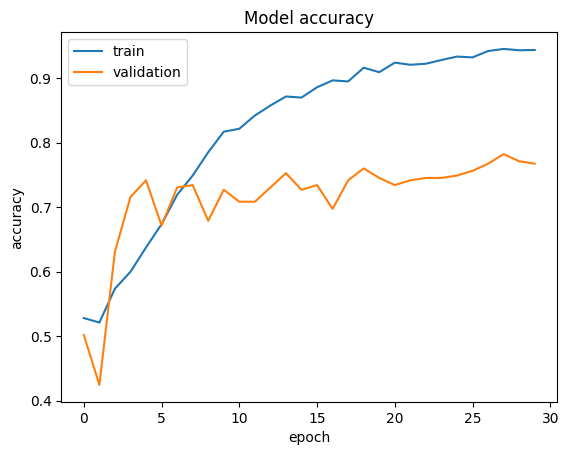

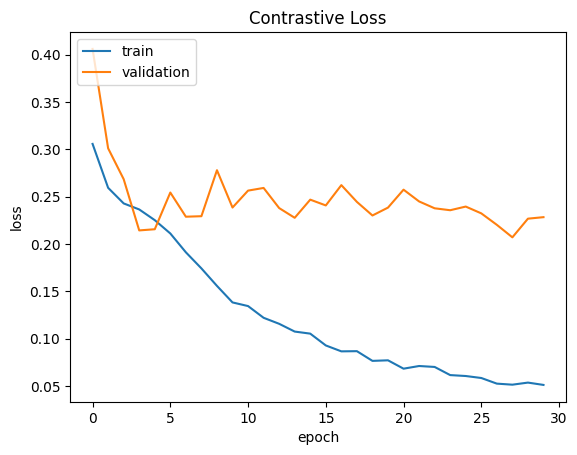

In [41]:

def plt_metric(history, metric, title, has_valid=True):
    """Plots the given 'metric' from 'history'.

    Arguments:
        history: history attribute of History object returned from Model.fit.
        metric: Metric to plot, a string value present as key in 'history'.
        title: A string to be used as title of plot.
        has_valid: Boolean, true if valid data was passed to Model.fit else false.

    Returns:
        None.
    """
    plt.plot(history[metric])
    if has_valid:
        plt.plot(history["val_" + metric])
        plt.legend(["train", "validation"], loc="upper left")
    plt.title(title)
    plt.ylabel(metric)
    plt.xlabel("epoch")
    plt.show()


# Plot the accuracy
plt_metric(history=history.history, metric="accuracy", title="Model accuracy")

# Plot the contrastive loss
plt_metric(history=history.history, metric="loss", title="Contrastive Loss")

## Evaluate the model

In [42]:
results = siamese.evaluate(val_data)
print("test loss, test acc:", results)

68/68 [==============================] - 7s 100ms/step - loss: 0.2283 - accuracy: 0.7675
test loss, test acc: [0.22834856808185577, 0.76752769947052]


## Visualize the predictions

In [43]:
def load_pair_test(left_path,right_path):
    im_left = cv2.imread(left_path)
    im_left = cv2.cvtColor(im_left,cv2.COLOR_BGR2RGB)
    im_right = cv2.imread(right_path)
    im_right = cv2.cvtColor(im_right,cv2.COLOR_BGR2RGB)
    return im_left,im_right

class TestGenerator(Sequence):
    def __init__(self, data_file, batch_size):
        self.data_file = data_file
        self.batch_size = batch_size
        self.num_samples = self.get_num_samples()
        self.num_batches = int(np.ceil(self.num_samples / self.batch_size))

    def get_num_samples(self):
        # Implement your logic to determine the total number of samples
        # in your dataset file and return that value.
        # For example, if your data file is a CSV file, you can use pandas
        # to read the file and count the number of rows.
        return len(self.data_file)

    def __len__(self):
        return self.num_batches

    def __getitem__(self, index):
        start_index = index * self.batch_size
        end_index = min(start_index + self.batch_size, self.num_samples)

        batch_x1, batch_x2 = self.load_data_chunk(start_index, end_index)

        # Preprocess your data if needed

        return np.array([batch_x1, batch_x2])

    def load_data_chunk(self, start_index, end_index):
        batch_x1 = []
        batch_x2 = []
        batch_y = []
        for i in range(start_index, end_index):
            name17,name21 = self.data_file[i]
            x1,x2= load_pair_test(name17,name21)
            batch_x1.append(x1)
            batch_x2.append(x2)

        return np.array(batch_x1), np.array(batch_x2)


In [46]:
path17 = "G:/DSI/1_DATA/IA/SQY/images62_5m/sqy_17/*.png"
path21 = "G:/DSI/1_DATA/IA/SQY/images62_5m/sqy_21/*.png"
names17 = glob.glob(path17)
names17 = [path17[:-5] + os.path.basename(x) for x in names17]
names21 = glob.glob(path21)
names21 = [path21[:-5] + os.path.basename(x) for x in names21]
test_files = np.array([np.array([x,y]) for x,y in zip(names17,names21)])
test_data = TestGenerator(test_files,batch_size)

In [ ]:
predictions = siamese.predict(test_data)
predictions = predictions.reshape(len(predictions))
# Visualize(test_data[0][0][0],test_data[0][0][1],test_data[0][1])
labels = [class_names[int(np.round(i))] for i in predictions]
labels

In [49]:
labels = [class_names[int(np.round(i))] for i in predictions]
labels[0:2]

['same', 'same']

In [53]:
meter_size = img_size * 0.15 # resolution
df = pd.DataFrame()
df["path17"] = names17
df["path21"] = names21
df["Xmin"] = df["path21"].apply(lambda x: float(os.path.basename(x).split("_")[0]))
df["Ymin"] = df["path21"].apply(lambda x: float(os.path.basename(x).split("_")[1][:-4]))
# df["Xmin"] = df["CENTROID_X"].apply(lambda x: (x - meter_size/2))
# df["Ymin"] = df["CENTROID_Y"].apply(lambda x: (x - meter_size/2))
df["CENTROID_X"] = df["Xmin"].apply(lambda x: x + meter_size/2)
df["CENTROID_Y"] = df["Ymin"].apply(lambda x: x + meter_size/2)
df["score"] = predictions
df["score"] = df["score"].apply(lambda x: np.round(x,2))
df["labels"] = labels
df

,path17,path21,Xmin,Ymin,CENTROID_X,CENTROID_Y,score,labels
0,G:/DSI/1_DATA/IA/SQY/images62_5m/sqy_17/618562...,G:/DSI/1_DATA/IA/SQY/images62_5m/sqy_21/618562...,618562.5,6850437.5,618593.775,6850468.775,0.0,same
1,G:/DSI/1_DATA/IA/SQY/images62_5m/sqy_17/618562...,G:/DSI/1_DATA/IA/SQY/images62_5m/sqy_21/618562...,618562.5,6850500.0,618593.775,6850531.275,0.0,same
2,G:/DSI/1_DATA/IA/SQY/images62_5m/sqy_17/618562...,G:/DSI/1_DATA/IA/SQY/images62_5m/sqy_21/618562...,618562.5,6850562.5,618593.775,6850593.775,0.0,same
3,G:/DSI/1_DATA/IA/SQY/images62_5m/sqy_17/618562...,G:/DSI/1_DATA/IA/SQY/images62_5m/sqy_21/618562...,618562.5,6850625.0,618593.775,6850656.275,0.0,same
4,G:/DSI/1_DATA/IA/SQY/images62_5m/sqy_17/618562...,G:/DSI/1_DATA/IA/SQY/images62_5m/sqy_21/618562...,618562.5,6850687.5,618593.775,6850718.775,0.0,same
...,...,...,...,...,...,...,...,...
33147,G:/DSI/1_DATA/IA/SQY/images62_5m/sqy_17/634312...,G:/DSI/1_DATA/IA/SQY/images62_5m/sqy_21/634312...,634312.5,6853625.0,634343.775,6853656.275,0.0,same
33148,G:/DSI/1_DATA/IA/SQY/images62_5m/sqy_17/634312...,G:/DSI/1_DATA/IA/SQY/images62_5m/sqy_21/634312...,634312.5,6853687.5,634343.775,6853718.775,0.0,same
33149,G:/DSI/1_DATA/IA/SQY/images62_5m/sqy_17/634312...,G:/DSI/1_DATA/IA/SQY/images62_5m/sqy_21/634312...,634312.5,6853750.0,634343.775,6853781.275,0.0,same
33150,G:/DSI/1_DATA/IA/SQY/images62_5m/sqy_17/634312...,G:/DSI/1_DATA/IA/SQY/images62_5m/sqy_21/634312...,634312.5,6853812.5,634343.775,6853843.775,0.0,same


In [55]:
df["labels"].value_counts()

labels
same       19991
changed    13161
Name: count, dtype: int64

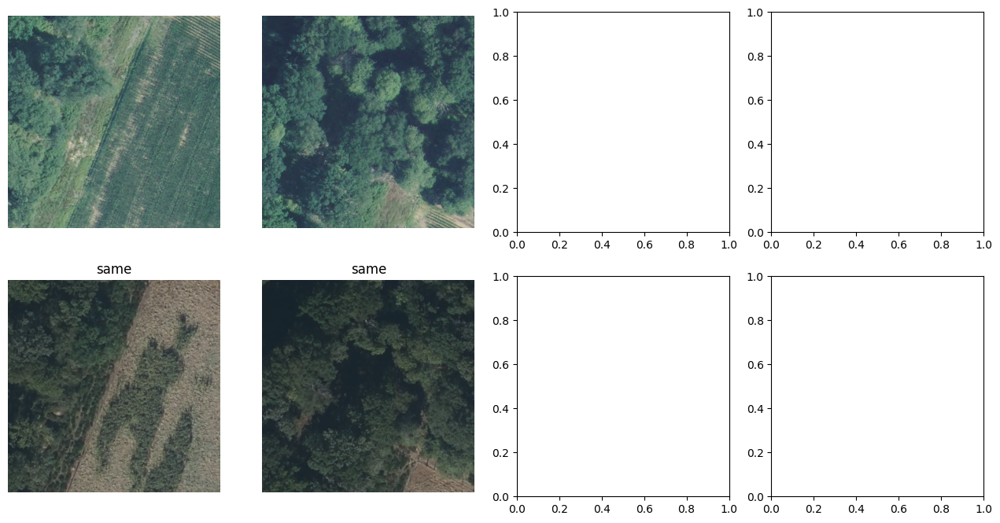

In [50]:
labels = np.array([class_names[int(np.round(i))] for i in predictions])
Visualize_pred(test_data[0][0],test_data[0][1],labels)

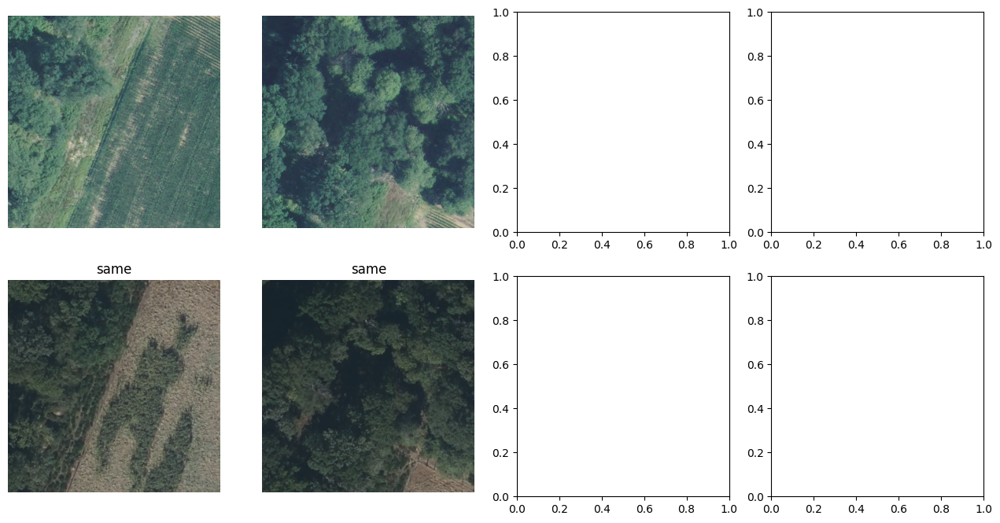

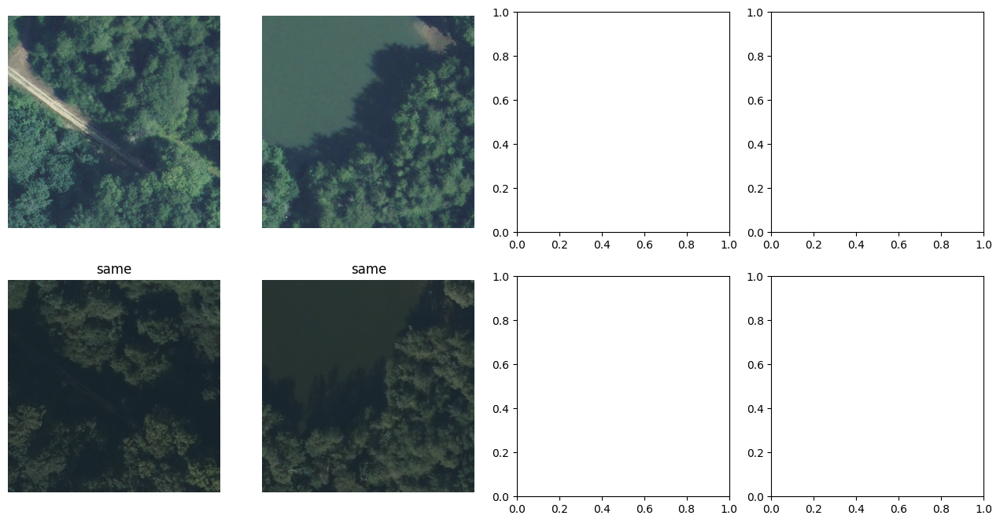

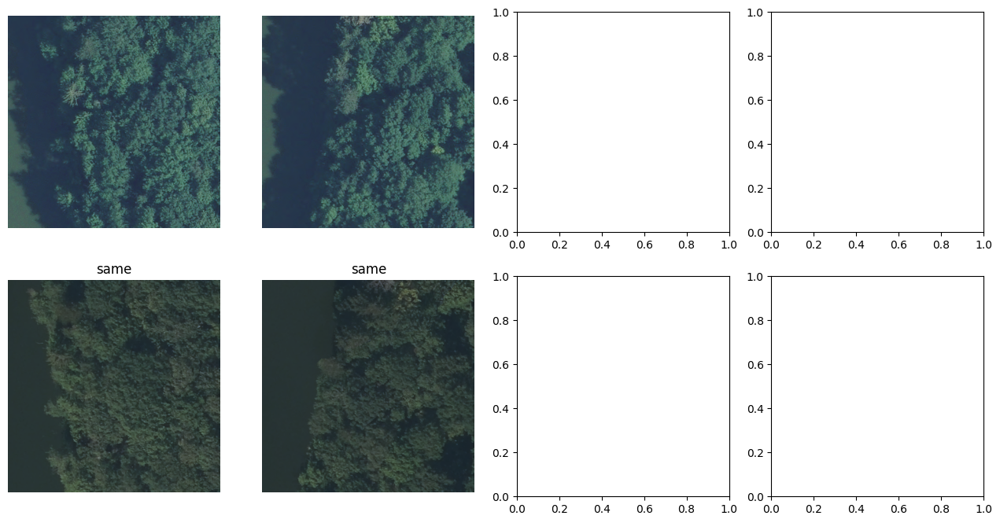

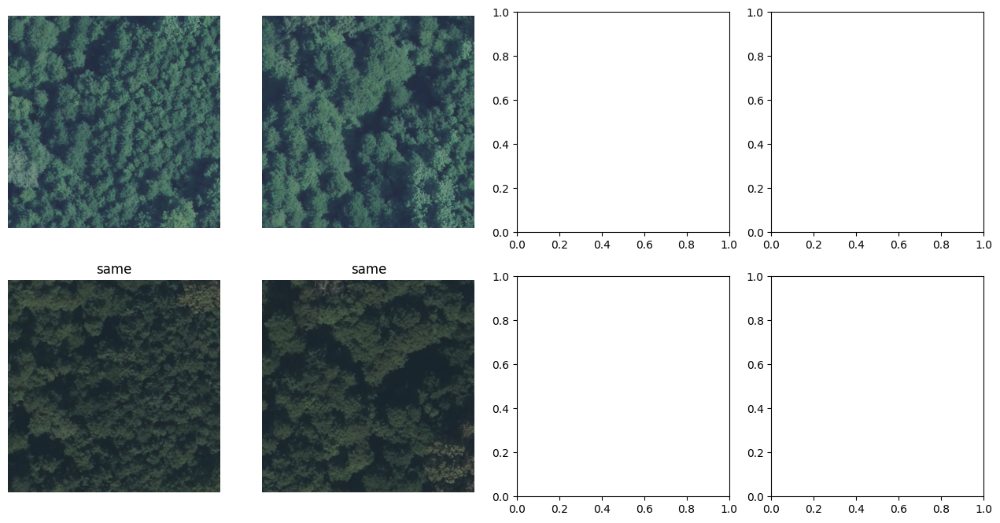

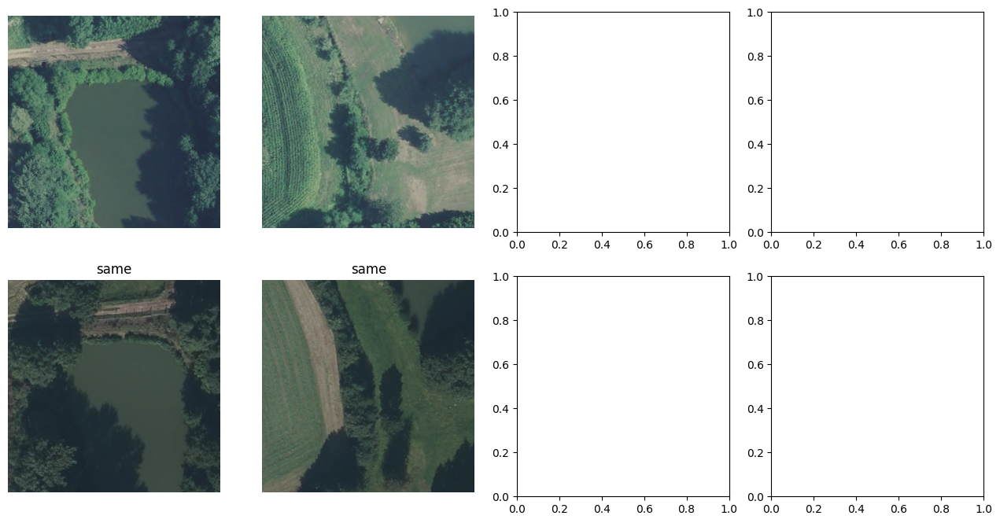

...

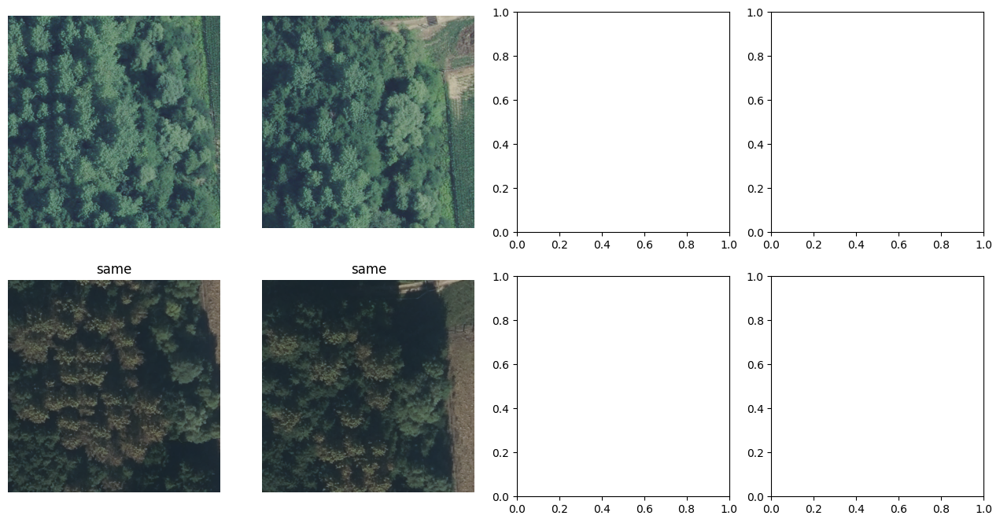

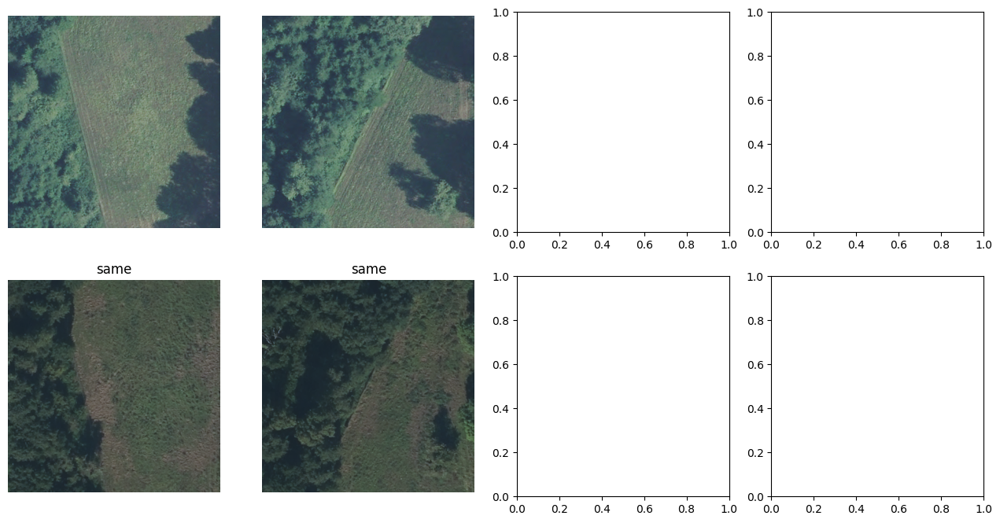

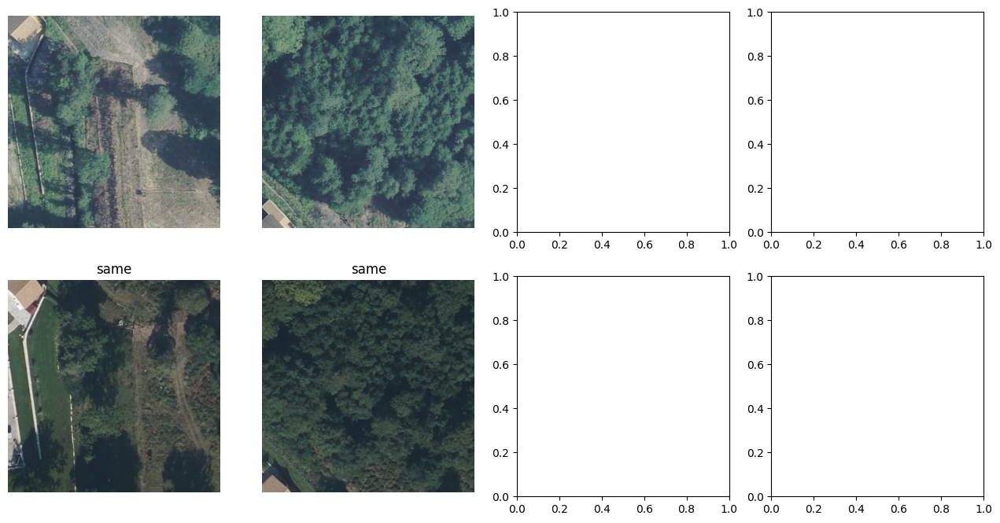

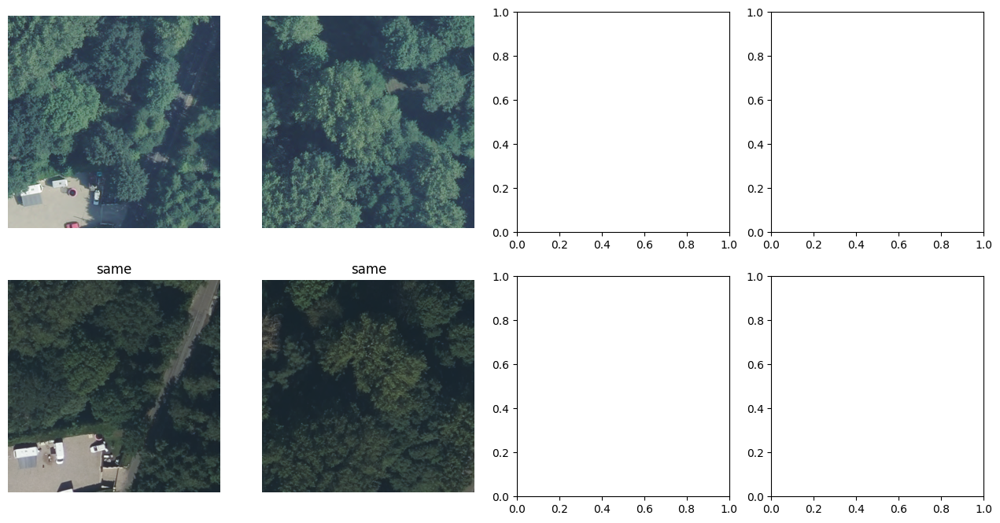

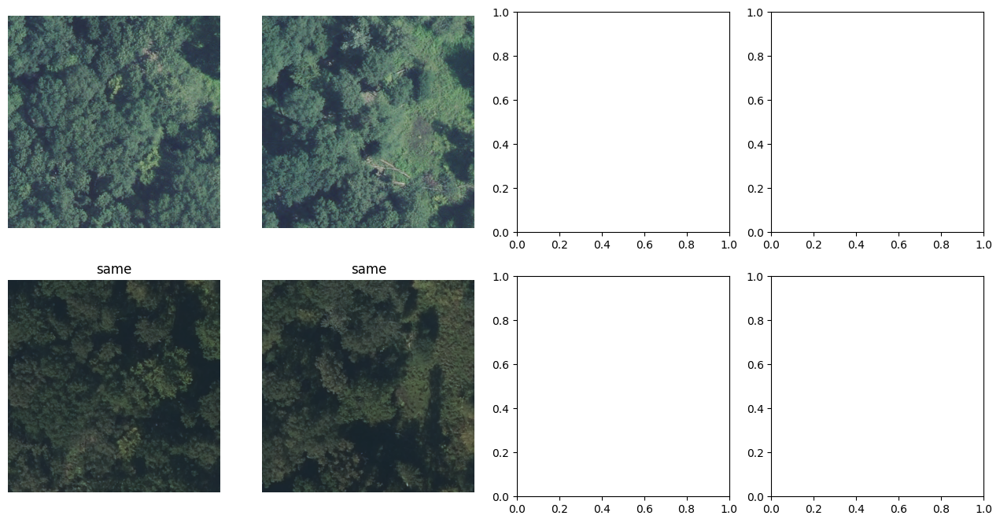

In [51]:
for i in range(16):
    temp = labels[i*batch_size:]
    Visualize_pred(test_data[i][0],test_data[i][1],temp)

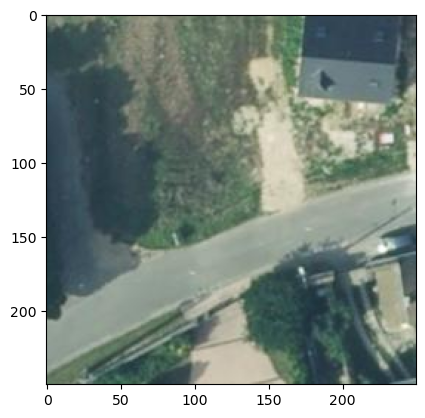

In [ ]:
plt.imshow(test_data[0][0][0])